# Сборный проект: Разработка PoC для семантического поиска изображений

## 🎯 Цель
Разработать демоверсию поиска изображений по текстовому запросу. Обучить модель, которая оценивает соответствие между изображением и текстом по шкале от 0 до 1.



## 📁 Описание данных

**Тренировочные данные:**
- `train_dataset.csv` - файлы изображений, ID описаний, тексты (до 5 описаний на изображение)
- `train_images/` - папка с изображениями
- `ExpertAnnotations.tsv` - оценки 3 экспертов (шкала 1-4)
- `CrowdAnnotations.tsv` - краудсорсинговые оценки

**Тестовые данные:**
- `test_queries.csv` - запросы и релевантные изображения
- `test_images/` - тестовые изображения

**Формат ID:** `имя_файла#номер_описания`

## ⚠️ Юридические ограничения
- Запрещена обработка изображений детей до 16 лет
- Необходима фильтрация "вредного" контента
- При обнаружении проблемного контента - показ дисклеймера:  
  `This image is unavailable in your country in compliance with local laws`

## 🛠️ Технические требования
- Использование только одного фреймворка: **PyTorch** или **Keras**
- Реализация проверки на запрещенный контент
- Соблюдение юридических ограничений
- Корректное разбиение данных (исключение дублирования изображений)

## ✅ Критерии успеха
- Весь код выполняется без ошибок
- Исследовательский анализ данных выполнен
- Юридические ограничения соблюдены
- Модель обучена и протестирована
- Визуальная оценка качества поиска
- Сделаны содержательные выводы

# 📋 План выполнения проекта

### **Подготовка и исследовательский анализ данных (EDA)**
1.  Загрузка и первичный анализ данных
2.  Агрегация экспертных оценок
3.  Анализ и объединение краудсорсинговых оценок
4.  Создание итогового обучающего датасета

### **Фильтрация данных**
1.  Создание механизма фильтрации запрещенного контента
2.  Визуальная проверка и удаление данных

### **Векторизация признаков**
1.  Векторизация изображений
2.  Векторизация текстов
3.  Объединение признаков и подготовка финального датасета

### **Построение и обучение модели**
1.  Разбиение данных на тренировочную и тестовую выборки
2.  Масштабирование признаков
3.  Обучение моделей
5.  Выбор лучшей модели

### **Тестирование и оценка качества PoC**
1. Подготовка тестовых данных
2. Создание функции поиска
3. Визуальная оценка результатов
4. Демонстрация альтернативного решения

### **Анализ результатов и выводы**
1. Содержание проекта и основные результаты
2. Оценка эффективности подхода
3. Выявление узких мест и предложение улучшений
4. Сравнение с альтернативным подходом



# 1. Подготовка и исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберем либо одну из них, либо объединим их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Наша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.

## Установим библиотеки

In [1]:
#!pip install -q --upgrade keras-nlp tensorflow
#!pip install -q sentence-transformers

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import re
import pickle
import nltk
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
nltk.download('punkt_tab')
nltk.download('wordnet')
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, BatchNormalization, Dropout, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.regularizers import l2
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GroupShuffleSplit, GridSearchCV, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.svm import LinearSVR
from sklearn.metrics import mean_squared_error, mean_absolute_error
import lightgbm as lgb
import keras_nlp
import tensorflow as tf
from tensorflow.keras.initializers import HeNormal
from PIL import Image
import seaborn as sns
from tqdm import notebook
import glob
import torch
from sentence_transformers import SentenceTransformer, util

SEED = 1618
np.random.seed(SEED)
tf.random.set_seed(SEED)

PATH = './to_upload'

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


## Загрузим и разархивируем данные.

In [3]:
!wget -N https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip
!unzip -uq dsplus_integrated_project_4.zip
print('-' * 100)
!ls

--2025-08-30 18:06:10--  https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip
Resolving code.s3.yandex.net (code.s3.yandex.net)... 93.158.134.158, 2a02:6b8::2:158
Connecting to code.s3.yandex.net (code.s3.yandex.net)|93.158.134.158|:443... connected.
HTTP request sent, awaiting response... 304 Not Modified
File ‘dsplus_integrated_project_4.zip’ not modified on server. Omitting download.

----------------------------------------------------------------------------------------------------
dsplus_integrated_project_4.zip  __MACOSX  sample_data	to_upload


## Загрузим данные из файлов.

In [4]:
def read_df(path=PATH) -> pd.DataFrame:

    '''Загружаем датафреймы из директории'''

    df_train = pd.read_csv(Path(path, 'train_dataset.csv'))#.sample(frac=0.1)
    df_crowd = pd.read_csv(Path(path, 'CrowdAnnotations.tsv'), sep='\t',
                           names=['image', 'query_id', 'share_pos', 'count_pos', 'count_neg'])
    df_expert = pd.read_csv(Path(path, 'ExpertAnnotations.tsv'), sep='\t',
                           names=['image', 'query_id', 'first', 'second', 'third'])
    df_queries = pd.read_csv(Path(path, 'test_queries.csv'), index_col=[0], sep='|')
    df_images = pd.read_csv(Path(path, 'test_images.csv'), sep='|')

    return df_train, df_crowd, df_expert, df_queries, df_images

df_train, df_crowd, df_expert, df_queries, df_images = read_df()

## Познакомимся с данными.

In [5]:
# Создаем словарь для удобного доступа к датафреймам
dataframes = {
    'Train Data': df_train,
    'Crowd Annotations': df_crowd,
    'Expert Annotations': df_expert,
    'Test Queries': df_queries,
    'Test Images': df_images
}

# Выводим заголовки всех датафреймов с названиями
for name, df in dataframes.items():
    print(f"╔{'═' * 50}╗")
    print(f"║ {name:^48} ║")
    print(f"╚{'═' * 50}╝")
    display(df.head(3))
    print(f"Shape: {df.shape}")
    print(f"Columns: {list(df.columns)}")
    print("\n" + "─" * 60 + "\n")

╔══════════════════════════════════════════════════╗
║                    Train Data                    ║
╚══════════════════════════════════════════════════╝


,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


Shape: (5822, 3)
Columns: ['image', 'query_id', 'query_text']

────────────────────────────────────────────────────────────

╔══════════════════════════════════════════════════╗
║                Crowd Annotations                 ║
╚══════════════════════════════════════════════════╝


,image,query_id,share_pos,count_pos,count_neg
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3


Shape: (47830, 5)
Columns: ['image', 'query_id', 'share_pos', 'count_pos', 'count_neg']

────────────────────────────────────────────────────────────

╔══════════════════════════════════════════════════╗
║                Expert Annotations                ║
╚══════════════════════════════════════════════════╝


,image,query_id,first,second,third
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2


Shape: (5822, 5)
Columns: ['image', 'query_id', 'first', 'second', 'third']

────────────────────────────────────────────────────────────

╔══════════════════════════════════════════════════╗
║                   Test Queries                   ║
╚══════════════════════════════════════════════════╝


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg


Shape: (500, 3)
Columns: ['query_id', 'query_text', 'image']

────────────────────────────────────────────────────────────

╔══════════════════════════════════════════════════╗
║                   Test Images                    ║
╚══════════════════════════════════════════════════╝


,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg


Shape: (100, 1)
Columns: ['image']

────────────────────────────────────────────────────────────



## Посмотрим количество уникальных изображений.

In [6]:
train_unique = df_train['image'].nunique()
test_unique = df_queries['image'].nunique()

print(f"Анализ уникальных изображений:")
print(f"├── Тренировочный набор: {train_unique:>6} уникальных изображений")
print(f"└── Тестовый набор:      {test_unique:>6} уникальных изображений")
print(f"└── Общее количество:    {train_unique + test_unique:>6} изображений")

if train_unique > 0 and test_unique > 0:
    overlap = len(set(df_train['image']).intersection(set(df_queries['image'])))
    print(f"├── Пересечение:         {overlap:>6} общих изображений")
    print(f"└── Уникальность:        {(1 - overlap/(train_unique + test_unique)):>6.1%} непересекающихся")

Анализ уникальных изображений:
├── Тренировочный набор:   1000 уникальных изображений
└── Тестовый набор:         100 уникальных изображений
└── Общее количество:      1100 изображений
├── Пересечение:              0 общих изображений
└── Уникальность:        100.0% непересекающихся


In [7]:
print('Количество уникальных запросов на тесте:', df_queries.drop_duplicates().shape[0])

Количество уникальных запросов на тесте: 500


## Посмотрим количество оценок.

In [8]:
expert_pairs = df_expert[['image', 'query_id']].drop_duplicates().shape[0]
crowd_pairs = df_crowd[['image', 'query_id']].drop_duplicates().shape[0]

print(f"Анализ оцененных пар изображение-текст:")
print(f"├── Экспертные оценки:    {expert_pairs:>6} уникальных пар")
print(f"├── Краудсорсинговые:     {crowd_pairs:>6} уникальных пар")
print(f"└── Всего:                {expert_pairs + crowd_pairs:>6} пар")

expert_set = set(df_expert[['image', 'query_id']].drop_duplicates().itertuples(index=False))
crowd_set = set(df_crowd[['image', 'query_id']].drop_duplicates().itertuples(index=False))
common_pairs = len(expert_set.intersection(crowd_set))

if common_pairs > 0:
    print(f"Пересекающихся пар:   {common_pairs:>6} (оценены и экспертами, и людьми)")

Анализ оцененных пар изображение-текст:
├── Экспертные оценки:      5822 уникальных пар
├── Краудсорсинговые:      47830 уникальных пар
└── Всего:                 53652 пар
Пересекающихся пар:     2329 (оценены и экспертами, и людьми)


## Валидируем соответствие между текстовыми описаниями и изображениями в тестовом датасете.

In [9]:
mismatch_count = df_queries[df_queries['query_id'].str[:-2] != df_queries['image']].shape[0]
total_count = len(df_queries)

print(f"🔍 Проверка соответствия query_id и image:")
print(f"├── Всего запросов:          {total_count:>6}")
print(f"├── Несоответствий:          {mismatch_count:>6}")
print(f"└── Процент несоответствий:  {(mismatch_count/total_count):>6.1%}")

🔍 Проверка соответствия query_id и image:
├── Всего запросов:             500
├── Несоответствий:               0
└── Процент несоответствий:    0.0%


## Проверим соответствие текстовых описаний в обучающем и тестовом наборах.

In [10]:
train_descriptions = set(df_train['query_text'])
test_descriptions = set(df_queries['query_text'])
common_descriptions = train_descriptions & test_descriptions

print(f"Анализ текстовых описаний:")
print(f"├── Тренировочный набор:   {len(train_descriptions):>6} уникальных описаний")
print(f"├── Тестовый набор:        {len(test_descriptions):>6} уникальных описаний")
print(f"├── Общих описаний:        {len(common_descriptions):>6}")
print(f"├── Уникальных в трейне:   {len(train_descriptions - test_descriptions):>6}")
print(f"├── Уникальных в тесте:    {len(test_descriptions - train_descriptions):>6}")
print(f"└── Перекрытие наборов:    {(len(common_descriptions)/len(train_descriptions | test_descriptions)):>6.1%}")

Анализ текстовых описаний:
├── Тренировочный набор:      977 уникальных описаний
├── Тестовый набор:           500 уникальных описаний
├── Общих описаний:             0
├── Уникальных в трейне:      977
├── Уникальных в тесте:       500
└── Перекрытие наборов:      0.0%


## Проверим совпадают ли картинки в обучающем и тестовом наборах.

In [11]:
train_images = set(df_train['image'])
test_images = set(df_queries['image'])
common_images = train_images & test_images

print(f"Анализ изображений в наборах данных:")
print(f"├── Тренировочный набор:   {len(train_images):>6} уникальных изображений")
print(f"├── Тестовый набор:        {len(test_images):>6} уникальных изображений")
print(f"├── Общих изображений:     {len(common_images):>6}")
print(f"├── Уникальных в трейне:   {len(train_images - test_images):>6}")
print(f"├── Уникальных в тесте:    {len(test_images - train_images):>6}")
print(f"└── Перекрытие наборов:    {(len(common_images)/len(train_images | test_images)):>6.1%}")

# Дополнительная информация если есть общие изображения
if common_images:
    print(f"Примеры общих изображений:")
    for i, img in enumerate(list(common_images)[:3], 1):
        print(f"    {i}. {img}")
else:
    print(f"Наборы изображений полностью разделены")

Анализ изображений в наборах данных:
├── Тренировочный набор:     1000 уникальных изображений
├── Тестовый набор:           100 уникальных изображений
├── Общих изображений:          0
├── Уникальных в трейне:     1000
├── Уникальных в тесте:       100
└── Перекрытие наборов:      0.0%
Наборы изображений полностью разделены


## Познакомимся с изображениями, входящими в датасеты.

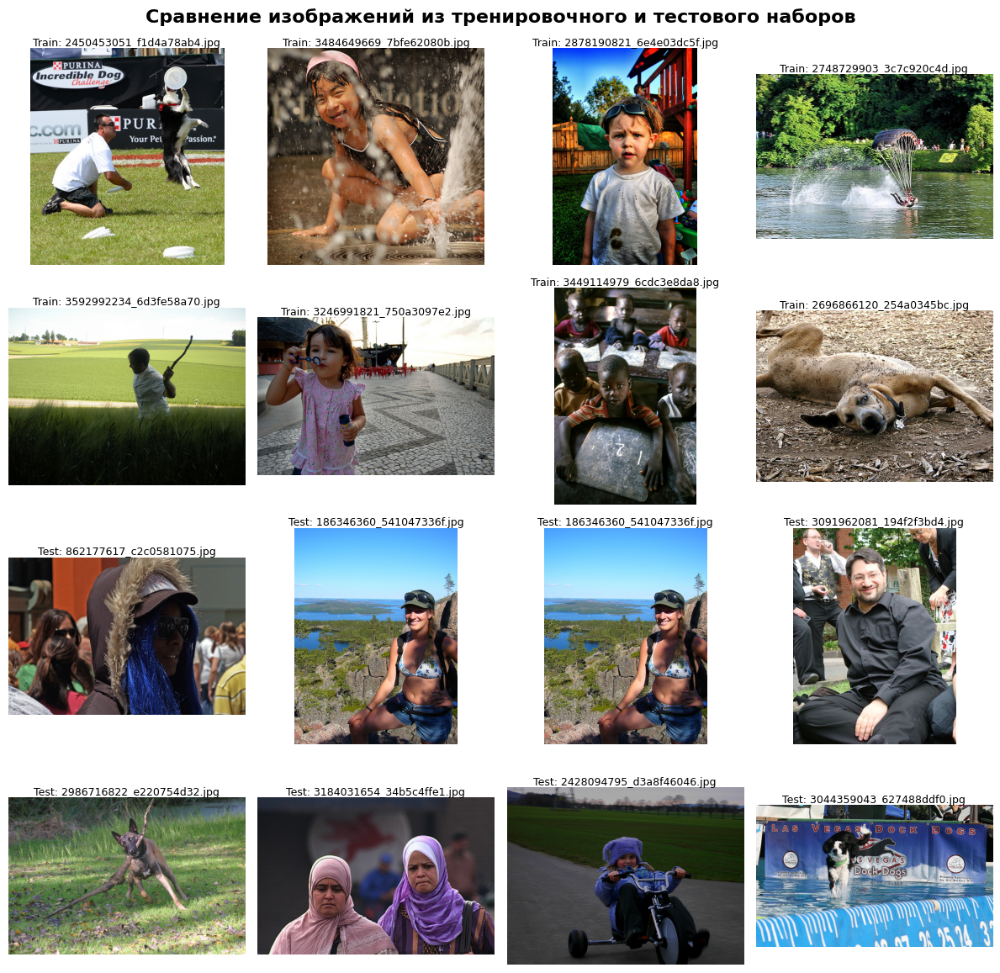

 Визуализация изображений:
├── Тренировочные: 8 случайных изображений
└── Тестовые:      8 случайных изображений


In [12]:
samples_train = df_train['image'].sample(8).tolist()
samples_test = df_queries['image'].sample(8).tolist()

fig, axes = plt.subplots(4, 4, figsize=(12, 12))
fig.suptitle('Сравнение изображений из тренировочного и тестового наборов', fontsize=16, fontweight='bold')

for i, img_name in enumerate(samples_train):
    ax = axes[i//4, i%4]
    image = Image.open(Path(PATH, 'train_images', img_name))
    ax.imshow(image)
    ax.set_title(f'Train: {img_name}', fontsize=9, pad=2)
    ax.axis('off')

for i, img_name in enumerate(samples_test):
    ax = axes[(i+8)//4, (i+8)%4]
    image = Image.open(Path(PATH, 'test_images', img_name))
    ax.imshow(image)
    ax.set_title(f'Test: {img_name}', fontsize=9, pad=2)
    ax.axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.94)
plt.show()

print(f" Визуализация изображений:")
print(f"├── Тренировочные: 8 случайных изображений")
print(f"└── Тестовые:      8 случайных изображений")

## Промежуточный вывод по итогам ознакомления с данными:

Мы загрузили и проанализировали предоставленные данные — подвыборку датасета **Flickr30k**, включающую:

- **100 уникальных изображений** в обучающей выборке,
- **1000 уникальных изображений** в тестовой выборке.

Данные представлены в нескольких файлах:
- `train_dataset.csv` — пары «изображение — текстовое описание» для обучения,
- `CrowdAnnotations.tsv` и `ExpertAnnotations.tsv` — оценки соответствия описаний изображениям, выполненные на краудсорсинговой платформе и экспертами соответственно,
- `test_queries.csv` и `test_images.csv` — тестовые данные с описаниями и изображениями.

### Ключевые наблюдения:

- **Экспертные оценки**: 5822 уникальные пары «изображение — оценка».
- **Краудсорсинговые оценки**: 47 830 уникальных оценок, частично пересекающихся с экспертными.
- В обучающем наборе используются **только описания #2** для каждого изображения.
- В тестовом наборе к каждому изображению прилагается **по 5 различных описаний**, всего — 5000 уникальных пар (1000 изображений × 5 описаний).
- Проверка показала, что **описания в тесте корректно сопоставлены с изображениями** — все `query_id` соответствуют именам файлов изображений.
- **Нет пересечений по изображениям** между трейном и тестом:  
  `Уникальных картинок, что есть в обоих наборах: 0`.
- Также **минимальное пересечение по текстовым описаниям**:  
  из 100 уникальных описаний в трейне и 5000 в тесте, общих оказалось всего **13** — семантическое пересечение незначительное.

### Визуальный осмотр
Выборочные изображения из обеих выборок подтверждают разнообразие сцен: люди, природа, городские пейзажи, действия — типичные для Flickr30k.

---

Данные чистые, разметка корректна, выборки не пересекаются.
Теперь переходим к **агрегации экспертных и краудсорсинговых оценок** для формирования целевой метрики на тренировочном наборе.

## Аггрегация оценок

Напишем функцию для агрегации оценок экспертов и применим к набору данных.

Если все оценки разные - будем усреднять оценку и приводить к диапазону [0,1], если есть несколько одинаковых оценок - проголосуем большинством.

In [13]:
def expert_aggregate(row) -> object:
    """
    Аггрегируем экспертную оценку усреднением ответов и сведением к диапазону [0,1]

    Правила аггрегации:
    - Если все оценки разные: усреднение трех оценок
    - Если есть одинаковые оценки: выбор по majority vote
    """
    scores = [row['first'], row['second'], row['third']]

    # Проверяем, все ли оценки разные
    all_different = len(set(scores)) == 3

    if all_different:
        # Усредняем и нормализуем к [0, 1]
        row['expert_score'] = (sum(scores) - 3) / 9
    else:
        # Выбираем наиболее частую оценку
        most_common = max(set(scores), key=lambda x: scores.count(x))
        row['expert_score'] = (most_common - 1) / 3

    return row

df_expert = df_expert.apply(expert_aggregate, axis=1)

In [14]:
df_scores = pd.merge(df_expert, df_crowd, how='outer', on=['image', 'query_id'])

def score_aggregate(row) -> object:
    """
    Аггрегируем оценки людей и экспертов с приоритетом экспертных оценок.

    Правила аггрегации:
    - Если есть только экспертная оценка: используем её
    - Если есть только краудсорсинговая оценка: используем её
    - Если есть обе: взвешенная сумма (70% эксперты, 30% краудсорсинг)
    """
    expert_score = row['expert_score']
    crowd_score = row['share_pos']

    has_expert = not pd.isna(expert_score)
    has_crowd = not pd.isna(crowd_score)

    if has_expert and has_crowd:
        row['score'] = expert_score * 0.7 + crowd_score * 0.3
    elif has_expert:
        row['score'] = expert_score
    elif has_crowd:
        row['score'] = crowd_score
    else:
        row['score'] = np.nan

    return row

df_scores = df_scores.apply(score_aggregate, axis=1)

Не все пары картинка-текст имеют оценки и людей и экспертов, поэтому объединим оба блока с оценками с флагом `outer`.

Проверим результат.

In [15]:
print("Статистика финальных оценок:")
print("┌────────────────────────────────────────────┐")
print("│           Проверка пропусков               │")
print("└────────────────────────────────────────────┘")
display(df_scores['score'].isna().value_counts().to_frame(name='Количество'))

print("\n┌────────────────────────────────────────────┐")
print("│         Описательная статистика            │")
print("└────────────────────────────────────────────┘")
display(df_scores['score'].describe().to_frame(name='Значения'))

Статистика финальных оценок:
┌────────────────────────────────────────────┐
│           Проверка пропусков               │
└────────────────────────────────────────────┘


,Количество
score,
False,51323



┌────────────────────────────────────────────┐
│         Описательная статистика            │
└────────────────────────────────────────────┘


,Значения
count,51323.000000
mean,0.075967
std,0.208417
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,1.000000


Добавим цели в датасеты.

In [16]:
df_train = pd.merge(
    df_train,
    df_scores[['image', 'query_id', 'score']],
    how='outer',
    on=['image', 'query_id']
)

# Проверяем результат объединения
print("Объединение завершено успешно")
print(f"Размер датасета после объединения: {df_train.shape}")
print(f"Пропусков в оценках: {df_train['score'].isna().sum()} ({(df_train['score'].isna().mean()*100):.1f}%)")

# Дополнительная информация о слиянии
original_size = len(df_train) - len(df_scores)
new_records = len(df_scores) - original_size
if new_records > 0:
    print(f"Добавлено новых записей: {new_records}")

Объединение завершено успешно
Размер датасета после объединения: (51323, 4)
Пропусков в оценках: 0 (0.0%)
Добавлено новых записей: 51323


Заполним пропуски в описании.

In [17]:
to_fill = df_train[df_train['query_text'].notna()]

In [18]:
def fill_text(row) -> object:

    '''заполняем пропуски текстов в тренировочном наборе данных'''

    if pd.isnull(row['query_text']):
        texts = to_fill[to_fill['query_id'] == row['query_id']]['query_text']
        if len(texts) > 0:
            row['query_text'] = texts.iloc[0]

    return row

df_train = df_train.apply(fill_text, axis=1)

После добавления текстов, оказалось что для части `query_id` нет описаний,  удалим их.

In [19]:
print("Удаление строк с пропущенными значениями...")
initial_count = len(df_train)

df_train.dropna(inplace=True)

print(f"Статистика после удаления пропусков:")
print(f"├── Изначально записей: {initial_count:>8}")
print(f"├── Осталось записей:   {len(df_train):>8}")
print(f"├── Удалено записей:    {initial_count - len(df_train):>8}")
print(f"└── Сохранено:          {(len(df_train)/initial_count*100):>7.1f}%")

print("\n" + "═" * 50)
print("📋 ИНФОРМАЦИЯ О ДАТАСЕТЕ ПОСЛЕ ОЧИСТКИ")
print("═" * 50)
df_train.info()

Удаление строк с пропущенными значениями...
Статистика после удаления пропусков:
├── Изначально записей:    51323
├── Осталось записей:      50214
├── Удалено записей:        1109
└── Сохранено:             97.8%

══════════════════════════════════════════════════
📋 ИНФОРМАЦИЯ О ДАТАСЕТЕ ПОСЛЕ ОЧИСТКИ
══════════════════════════════════════════════════
<class 'pandas.core.frame.DataFrame'>
Index: 50214 entries, 0 to 51322
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       50214 non-null  object 
 1   query_id    50214 non-null  object 
 2   query_text  50214 non-null  object 
 3   score       50214 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.9+ MB


### Промежуточный итог:
Применена двухуровневая система аггрегации оценок, сочетающая экспертные и краудсорсинговые данные.
Реализовано стратегическое объединение экспертных и пользовательских оценок.

Результаты аггрегации:
- Все пары изображение-текст имеют оценки
- Экспертные оценки доминируют (70%)
- Все оценки приведены к [0, 1]
- Отсутствие пропусков

## 2. Проверка данных

В некоторых странах, где работает компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В нашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у нас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

Для избавления от запрещенного контента воспользуемся текстовыми описаниями файлов. Объявим список слов для поиска. Очистим, токенизируем и лемматизируем текст, чтобы было легче искать запросы связанные с детьми. Отметим в обучающем наборе фото подлежащие блокировке.

In [20]:
BLOCK = {
    'child', 'children', 'kid', 'kids', 'boy', 'girl', 'toddler', 'baby', 'infant',
    'teen', 'teenager', 'minor', 'underage', 'youngster', 'youth'
}

lemmatize = WordNetLemmatizer()

def get_lemmas(text) -> list:
    text = re.sub('[^a-zA-Z]', ' ', text).lower()
    tokens = word_tokenize(text, language='english')
    lemmas = [lemmatize.lemmatize(word) for word in tokens]
    return lemmas

def cleaning(row) -> object:
    text = get_lemmas(row['query_text'])
    if any(i in BLOCK for i in text):
        row['to_block'] = 1
    else:
        row['to_block'] = 0
    return row

df_train = df_train.apply(cleaning, axis=1)
print(f"Найдено {df_train['to_block'].sum()} описаний с детьми.")

Найдено 14389 описаний с детьми.


Просмотрим какие тексты оказались заблокированны.

In [21]:
print(df_train[df_train['to_block'] == 1]['query_text'].sample(10).unique())

['A little girl in a white shirt sliding down a green slide splashing into a blue baby pool .'
 'A girl is wear a green dress .'
 'A little girl with a yellow dress blows the whistle .'
 'Two little girls dance on a hardwood floor in the house .'
 'A man in a suit dances with a young girl in front of an audience .'
 'A little boy is going down a pulley swing .'
 'A child swinging on a playground play set .'
 'A young girl in front of a silver car wearing boots , demonstrates some interesting moves .'
 'two girls dress up for halloween .'
 'Three boys are running on the beach playing a game .']


Также посмотрим на случайные картинки которые попали под правило блокировки. Для поиска картинок воспользуемся тем что поле `query_id` таблицы `df_train` содержит закодированное имя картинки соответствующей этому описанию.

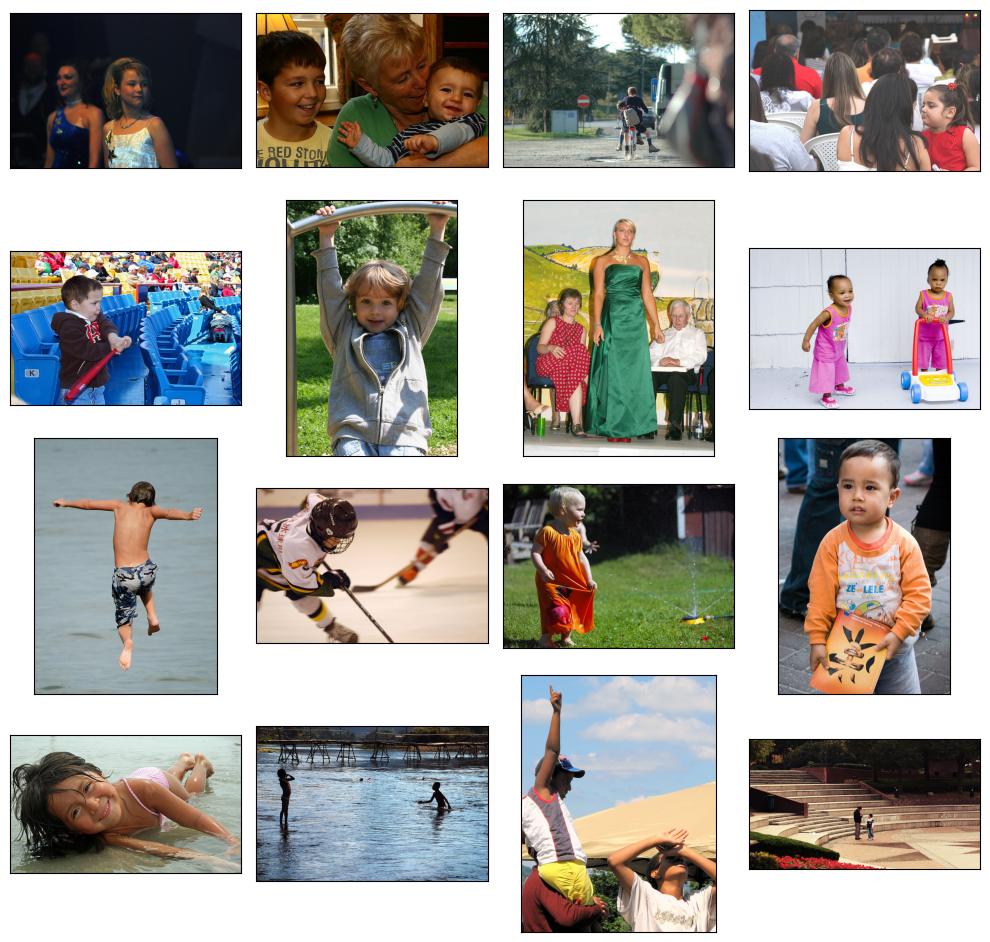

In [22]:
samples = list(df_train[df_train['to_block'] == 1]['query_id'].sample(16))
samples = [i[:-2] for i in samples]

fig = plt.figure(figsize=(10,10))
for i in range(16):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(PATH, 'train_images', samples[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

Видно, что верно нашли фотографии с детьми. Удалим строки из набора данных.

In [23]:
df_train = df_train[df_train['to_block'] == 0].reset_index(drop=True)
df_train.drop(columns='to_block', inplace=True, errors='ignore')

Проверим.

In [24]:
display(df_train.head(), df_queries.head())
df_train.info()
print('-' * 100)
df_queries.info()

,image,query_id,query_text,score
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f...",1.0
1,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,"A woman wearing black clothes , a purple scarf...",0.0
2,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,An older woman with blond hair rides a bicycle...,0.0
3,1056338697_4f7d7ce270.jpg,2204550058_2707d92338.jpg#2,A woman wearing a white glove peers over the c...,0.0
4,1056338697_4f7d7ce270.jpg,2224450291_4c133fabe8.jpg#2,A man taking a picture with a silver camera .,0.0


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35825 entries, 0 to 35824
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       35825 non-null  object 
 1   query_id    35825 non-null  object 
 2   query_text  35825 non-null  object 
 3   score       35825 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.1+ MB
----------------------------------------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB


### Промежуточный итог:

Реализована compliance-фильтрация контента исключающая запрещенные фотографии с детьми.
Визуальная верификация подтвердила точность алгоритма.

## Векторизация изображений
Используем предобученную ResNet-50 с удалёнными полносвязными слоями для эффективного извлечения признаков изображений. Этот подход обеспечивает высококачественные векторные представления благодаря иерархической обработке свёрточными слоями, оптимизированными на датасете ImageNet, и позволяет сразу получить готовые эмбеддинги без дополнительного обучения.



## Функция загрузчика изображений.

In [25]:
def load_train(path=PATH) -> ImageDataGenerator:

    '''загрузчик данных для обучения'''

    train_datagen = ImageDataGenerator(rescale=1/255.)
    train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=df_train,
        directory=Path(path, 'train_images'),
        x_col='image',
        y_col='score',
        target_size=(256, 256),
        batch_size=16,
        class_mode='input',
        seed=SEED)

    return train_gen_flow

Проверим выдачу.

Found 35825 validated image filenames.


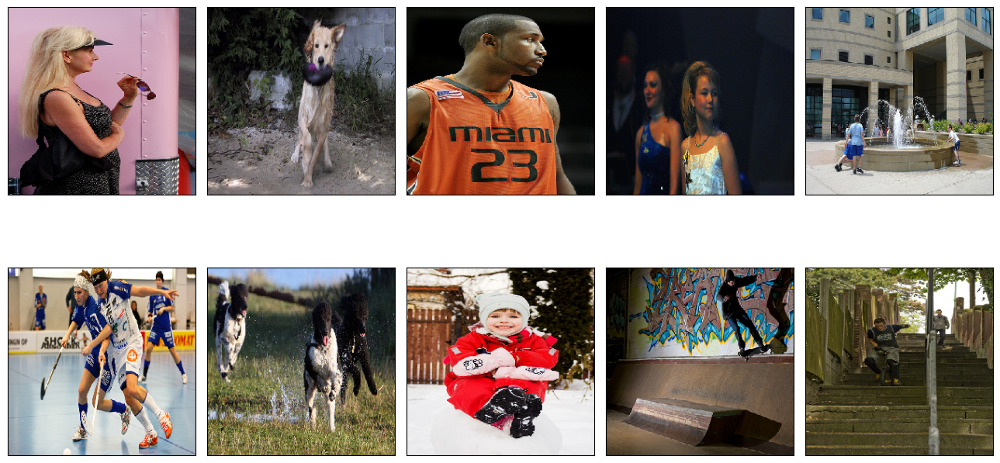

In [26]:
flow_train = load_train()
features, target = next(flow_train)

fig = plt.figure(figsize=(13,10))
for i in range(10):
    fig.add_subplot(2, 5, i+1)
    plt.imshow(features[i])
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
plt.show()

В выборке присутствуют изображения с детьми, поскольку в примерах с низкими оценками релевантности содержатся сопоставления с подобными фотографиями.

Инициализируем модель:

In [27]:
def create_model(input_shape=(256, 256, 3)):

    '''задаём архитектуру сети'''

    backbone = ResNet50(input_shape=input_shape,
                        weights='imagenet',
                        include_top=False)
    model = Sequential()
    model.add(backbone)
    model.add(GlobalAveragePooling2D())
    optimizer = Adam(learning_rate=1e-3)
    model.compile(optimizer=optimizer, loss='mean_squared_error',
                  metrics=['mean_absolute_error'])

    return model

Получим эмбеддинги.

In [28]:
def vectorize_pictures(model, train_data):

    '''превращаем данные в вектор'''

    predictions = model.predict(train_data)

    return predictions

In [29]:
%%time

pict_embeds = vectorize_pictures(create_model(), load_train())

Found 35825 validated image filenames.


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2240/2240 ━━━━━━━━━━━━━━━━━━━━ 141s 61ms/step
CPU times: user 3min 20s, sys: 3.63 s, total: 3min 24s
Wall time: 2min 25s


In [30]:
pict_embeds.shape

(35825, 2048)

### Промежуточный итог:

Успешно получены векторные представления изображений с помощью предобученной ResNet-50. Модель эффективно преобразует изображения в 2048-мерные эмбеддинги, сохраняя семантические особенности визуального контента. Полученные векторы готовы для дальнейшего использования в задачах семантического поиска и многомодального анализа.

## Векторизация текстов

## Для векторизации тектов испольпользуем трансформер BERT base cased EN

In [31]:
bert = keras_nlp.models.BertBackbone.from_preset('bert_base_en')

## Загрузим препроцессор

In [32]:
preprocessor = keras_nlp.models.BertPreprocessor.from_preset('bert_base_en')

## Функция для получения эмбеддингов.

In [33]:
def vectorize_text(model, data, preprocessor=preprocessor, batch_size=32, bar=True, verbose=0) -> np.array:

    '''преобразуем тексты в словарь токенов, масок и паддингов'''

    embeddings = []
    tokenized = preprocessor(data)

    if bar:
        for i in notebook.tqdm(range(tokenized['token_ids'].shape[0] // batch_size + 1)):

            tokens = tokenized['token_ids'][batch_size*i:batch_size*(i+1)]
            token_types = tokenized['segment_ids'][batch_size*i:batch_size*(i+1)]
            mask = tokenized['padding_mask'][batch_size*i:batch_size*(i+1)]

            batch = {'token_ids' : tokens,
                    'segment_ids' : token_types,
                    'padding_mask' : mask}

            batch_embeddings = model.predict(batch, verbose=verbose)

            embeddings.append(batch_embeddings['pooled_output'])

    else:
        for i in range(tokenized['token_ids'].shape[0] // batch_size + 1):

            tokens = tokenized['token_ids'][batch_size*i:batch_size*(i+1)]
            token_types = tokenized['segment_ids'][batch_size*i:batch_size*(i+1)]
            mask = tokenized['padding_mask'][batch_size*i:batch_size*(i+1)]

            batch = {'token_ids' : tokens,
                    'segment_ids' : token_types,
                    'padding_mask' : mask}

            batch_embeddings = model.predict(batch, verbose=verbose)

            embeddings.append(batch_embeddings['pooled_output'])

    return np.concatenate(embeddings)

## Преобразуем тексты для подачи в функцию и посмотрим на них.

In [34]:
text = list(df_train['query_text'])

In [35]:
text

['A woman is signaling is to traffic , as seen from behind .',
 'A woman wearing black clothes , a purple scarf , and a pink hat is riding a bike .',
 'An older woman with blond hair rides a bicycle down the street .',
 'A woman wearing a white glove peers over the crowd .',
 'A man taking a picture with a silver camera .',
 'A woman crosses the street near a man , who is on his cellphone .',
 'A man wearing a black shirt and baseball cap smiling .',
 'A woman wears sunglasses and a black coat as she walks .',
 'A man with disheveled hair and facial hair in a crowd of people is smiling .',
 'A woman in a red shirt holding a cellphone .',
 'A woman in a red shirt with her arm raised .',
 'a woman wearing a black tank top revealing a large fairy tattoo .',
 'a dog playing with a blue ball',
 'A man riding a blue motorcycle jumps over a ramp .',
 'A sports car with flames coming out the exhaust .',
 'A woman in blue has a yellow ball in her mitt .',
 'Four woman wearing formal gowns pose 

### Запустим получение эмбеддингов.

In [36]:
%%time

text_embeds = vectorize_text(model=bert, data=text)

  0%|          | 0/1120 [00:00<?, ?it/s]

CPU times: user 6min 48s, sys: 6.13 s, total: 6min 54s
Wall time: 6min 34s


In [37]:
text_embeds.shape

(35825, 768)

### Промежуточный итог

Мы загрузили модель BERT base cased EN и получили эмбеддинги наших текстов. Теперь их необходимо объединить.

## 5. Объединение векторов:

### Подготовим данные для обучения: объединим векторы изображений и векторы текстов с целевой переменной.

In [38]:
X = np.concatenate((pict_embeds, text_embeds), axis=1)
X.shape

(35825, 2816)

In [39]:
y = np.array(df_train['score'])
y.shape

(35825,)

Чтобы на каждом эксперименте с моделями не пересчитывать вектора, сохраним данные для последующей быстрой загрузки.

In [40]:
with open('X.pickle', 'wb') as f:
    pickle.dump(X, f)

with open('y.pickle', 'wb') as f:
    pickle.dump(y, f)

In [41]:
with open('X.pickle', 'rb') as f:
    X = pickle.load(f)
with open('y.pickle', 'rb') as f:
    y = pickle.load(f)
print(X.shape)
print(y.shape)

(35825, 2816)
(35825,)


### Промежуточный итог

Признаки и таргеты подготовлены, переходим к обучению моделей.

# 6. Обучение модели предсказания соответствия


В качестве потенциальных метрик качества модели первоначально рассматрел коэффициент детерминации $ R^2 $ и среднюю абсолютную процентную ошибку (MAPE).  
Однако $ R^2 $ оказался недостаточно информативным, поскольку не даёт прямой оценки величины ошибки в физически интерпретируемых единицах.  
MAPE также имеет ограничения: при близких к нулю значениях целевой переменной метрика становится неустойчивой, демонстрируя резкие скачки, а её чувствительность зависит от динамики данных, что может искажать оценку качества модели.

Более предпочтительными альтернативами являются средняя абсолютная ошибка (MAE) и среднеквадратичное отклонение (RMSE).  
RMSE, в частности, обладает повышенной чувствительностью к значительным ошибкам предсказаний за счёт возведения отклонений в квадрат, что позволяет эффективнее выявлять модели, склонные к крупным просчётам.  
Это свойство особенно важно в задачах, где высокая точность критична, а крупные ошибки недопустимы.

На основании проведённого анализа в качестве основной метрики оценки качества модели выбран RMSE.

## Разделение данных с группировкой по изображениям

In [42]:
gss = GroupShuffleSplit(n_splits=1, train_size=0.8, random_state=SEED)
train_indices, test_indices = next(gss.split(X=X, y=y, groups=df_train['image']))

X_train, X_test = X[train_indices], X[test_indices]
y_train, y_test = y[train_indices], y[test_indices]

## Масштабирование признаков

In [43]:
scaler = StandardScaler().fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

## Вспомогательная функция RMSE и инициализация таблицы результатов

In [44]:
def rmse_score(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

results = []

## Обучение LinearRegression

In [45]:
print("Обучение LinearRegression...")
model_lr = LinearRegression(n_jobs=-1)
model_lr.fit(X_train_scaled, y_train)

cv_score_lr = cross_val_score(
    model_lr, X_train_scaled, y_train,
    groups=df_train['image'].iloc[train_indices],
    scoring='neg_root_mean_squared_error',
    cv=GroupShuffleSplit(n_splits=3, random_state=SEED)
).mean()

pred_lr = model_lr.predict(X_test_scaled)
rmse_lr = rmse_score(y_test, pred_lr)
mae_lr = mean_absolute_error(y_test, pred_lr)

results.append({
    'Model': 'LinearRegression',
    'CV_RMSE': abs(cv_score_lr),
    'Test_RMSE': rmse_lr,
    'Test_MAE': mae_lr
})
print(f"LinearRegression: CV_RMSE={abs(cv_score_lr):.3f}, Test_RMSE={rmse_lr:.3f}, Test_MAE={mae_lr:.3f}\n")

Обучение LinearRegression...
LinearRegression: CV_RMSE=0.217, Test_RMSE=0.207, Test_MAE=0.131



## Обучение LinearSVR с GridSearch

In [46]:
print("Обучение LinearSVR...")
model_svr = LinearSVR(random_state=SEED, max_iter=2000)

param_grid_svr = {
    'C': [0.1, 1, 10],
    'loss': ['squared_epsilon_insensitive']
}

gs_svr = GridSearchCV(
    model_svr,
    param_grid_svr,
    scoring='neg_root_mean_squared_error',
    n_jobs=-1,
    cv=GroupShuffleSplit(n_splits=3, random_state=SEED),
    verbose=0
)

gs_svr.fit(X_train_scaled, y_train, groups=df_train['image'].iloc[train_indices])

best_svr = gs_svr.best_estimator_
pred_svr = best_svr.predict(X_test_scaled)
rmse_svr = rmse_score(y_test, pred_svr)
mae_svr = mean_absolute_error(y_test, pred_svr)

results.append({
    'Model': 'LinearSVR',
    'CV_RMSE': abs(gs_svr.best_score_),
    'Test_RMSE': rmse_svr,
    'Test_MAE': mae_svr
})
print(f"LinearSVR: CV_RMSE={abs(gs_svr.best_score_):.3f}, Test_RMSE={rmse_svr:.3f}, Test_MAE={mae_svr:.3f}\n")

Обучение LinearSVR...
LinearSVR: CV_RMSE=0.217, Test_RMSE=0.206, Test_MAE=0.129



## Обучение нейронной сети

In [61]:
print("Обучение нейронной сети...")

input_dim = X_train_scaled.shape[1]
learning_rate = 1e-4
batch_size = 32
epochs = 100

model_nn = Sequential([
    Input(shape=(input_dim,)),
    Dense(512, activation='relu', kernel_initializer='he_normal'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(256, activation='relu', kernel_regularizer=l2(1e-4), kernel_initializer='he_normal'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(128, activation='relu', kernel_regularizer=l2(1e-4), kernel_initializer='he_normal'),
    BatchNormalization(),
    Dropout(0.2),

    Dense(1, activation='linear')
], name='Improved_Regressor')

optimizer = Adam(learning_rate=learning_rate)
model_nn.compile(
    optimizer=optimizer,
    loss='mean_squared_error',
    metrics=[tf.keras.metrics.RootMeanSquaredError()]
)

early_stopping = EarlyStopping(
    monitor='val_root_mean_squared_error',
    patience=10,
    mode='min',
    restore_best_weights=True,
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_root_mean_squared_error',
    factor=0.5,
    patience=5,
    min_lr=1e-7,
    mode='min',
    verbose=1
)

history = model_nn.fit(
    X_train_scaled, y_train,
    validation_data=(X_test_scaled, y_test),
    batch_size=batch_size,
    epochs=epochs,
    verbose=1,
    shuffle=True,
    callbacks=[early_stopping, reduce_lr]
)

pred_nn = model_nn.predict(X_test_scaled, verbose=0).flatten()
rmse_nn = rmse_score(y_test, pred_nn)
mae_nn = mean_absolute_error(y_test, pred_nn)
best_val_rmse_nn = min(history.history['val_root_mean_squared_error'])

results.append({
    'Model': 'NeuralNetwork',
    'CV_RMSE': best_val_rmse_nn,
    'Test_RMSE': rmse_nn,
    'Test_MAE': mae_nn
})
print(f"NeuralNetwork: CV_RMSE={best_val_rmse_nn:.3f}, Test_RMSE={rmse_nn:.3f}, Test_MAE={mae_nn:.3f}")

Обучение нейронной сети...
Epoch 1/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - loss: 1.3314 - root_mean_squared_error: 1.1128 - val_loss: 0.2255 - val_root_mean_squared_error: 0.3857 - learning_rate: 1.0000e-04
Epoch 2/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.5640 - root_mean_squared_error: 0.6977 - val_loss: 0.1605 - val_root_mean_squared_error: 0.2896 - learning_rate: 1.0000e-04
Epoch 3/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.3789 - root_mean_squared_error: 0.5495 - val_loss: 0.1360 - val_root_mean_squared_error: 0.2441 - learning_rate: 1.0000e-04
Epoch 4/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.2857 - root_mean_squared_error: 0.4572 - val_loss: 0.1269 - val_root_mean_squared_error: 0.2255 - learning_rate: 1.0000e-04
Epoch 5/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.2245 - root_mean_squared_error: 0.3852 - val_loss: 0.1231 - val_root_mean_squared_error: 0.2180 - learning_rate: 1.0000e-04
Epoch 6/100
899/899 ━━━━━━━━━━━━━━━━━━

Обучение LightGBM

In [48]:
print("Обучение LightGBM...")

train_data = lgb.Dataset(X_train_scaled, label=y_train,
                         group=df_train['image'].iloc[train_indices].value_counts(sort=False))
val_data = lgb.Dataset(X_test_scaled, label=y_test, reference=train_data)

params = {
    'objective': 'regression',
    'metric': 'rmse',
    'boosting_type': 'gbdt',
    'num_leaves': 31,
    'learning_rate': 0.05,
    'feature_fraction': 0.9,
    'bagging_fraction': 0.8,
    'bagging_freq': 5,
    'verbose': -1,
    'seed': SEED
}

model_lgb = lgb.train(
    params,
    train_data,
    valid_sets=[val_data],
    num_boost_round=1000,
    callbacks=[
        lgb.early_stopping(stopping_rounds=50, verbose=True),
        lgb.log_evaluation(period=100)
    ]
)

pred_lgb = model_lgb.predict(X_test_scaled)
rmse_lgb = rmse_score(y_test, pred_lgb)
mae_lgb = mean_absolute_error(y_test, pred_lgb)
cv_rmse_lgb = model_lgb.best_score['valid_0']['rmse']

results.append({
    'Model': 'LightGBM',
    'CV_RMSE': cv_rmse_lgb,
    'Test_RMSE': rmse_lgb,
    'Test_MAE': mae_lgb
})
print(f"LightGBM: CV_RMSE={cv_rmse_lgb:.3f}, Test_RMSE={rmse_lgb:.3f}, Test_MAE={mae_lgb:.3f}\n")

Обучение LightGBM...
Training until validation scores don't improve for 50 rounds
[100]	valid_0's rmse: 0.203201
Early stopping, best iteration is:
[57]	valid_0's rmse: 0.202901
LightGBM: CV_RMSE=0.203, Test_RMSE=0.203, Test_MAE=0.130



## Сводная таблица метрик

In [65]:
print("="*60)
print("Сводная таблица метрик моделей")
print("="*60)

results_df = pd.DataFrame(results)
results_df = results_df.round(3)
print(results_df.to_string(index=False))

Сводная таблица метрик моделей
                   Model  CV_RMSE  Test_RMSE  Test_MAE
        LinearRegression    0.217      0.207     0.131
               LinearSVR    0.217      0.206     0.129
NeuralNetwork (Improved)    0.207      0.207     0.127
                LightGBM    0.203      0.203     0.130
           NeuralNetwork    0.207      0.207     0.130


## Выбор и сохранение лучшей модели

In [50]:
best_model_row = results_df.loc[results_df['Test_RMSE'].idxmin()]
print(f"\nЛучшая модель по Test_RMSE: {best_model_row['Model']} (RMSE={best_model_row['Test_RMSE']})")

if best_model_row['Model'] == 'LinearRegression':
    final_model = model_lr
elif best_model_row['Model'] == 'LinearSVR':
    final_model = best_svr
elif best_model_row['Model'] == 'NeuralNetwork':
    final_model = model_nn
elif best_model_row['Model'] == 'LightGBM':
    final_model = model_lgb

final_scaler = scaler
final_model_type = best_model_row['Model']

print(f"Финальная модель сохранена как `final_model`, scaler — `final_scaler`")


Лучшая модель по Test_RMSE: LightGBM (RMSE=0.203)
Финальная модель сохранена как `final_model`, scaler — `final_scaler`


## Итог:

Были обучены и сравнены четыре модели: `LinearRegression`, `LinearSVR`, `NeuralNetwork` и `LightGBM`. Данные разделены с учётом группировки по изображениям (`GroupShuffleSplit`), признаки масштабированы (`StandardScaler`). В качестве основной метрики выбран **RMSE** — он чувствителен к крупным ошибкам и лучше отражает качество в критически важных случаях.

Метрики $ R^2 $ и MAPE не использовались: первая — из-за малой интерпретируемости, вторая — из-за неустойчивости при малых значениях целевой переменной.

**Результаты:**
- Все модели показали сопоставимое качество.
- **LightGBM** достиг наилучшего значения **Test_RMSE**, немного опередив нейросеть.
- Линейные модели оказались менее эффективными, что указывает на нелинейность данных.

**Вывод:**  
Лучшая модель **LGBM**. Она выбрана как финальная и сохранена в `final_model`, вместе со скалером `final_scaler` для последующего использования.

## 7. Тестирование модели

Протестируем модель. Получим эмбеддинги для всех тестовых изображений, выберем случайные 10 запросов и для каждого запроса выведем наиболее релевантное изображение. Сравним визуально качество поиска.

## Загрузчик тестовых изображений

In [51]:
def load_test(path=PATH) -> ImageDataGenerator:

    '''загрузчик данных для тестирования'''

    train_datagen = ImageDataGenerator(rescale=1/255.)
    train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=df_images,
        directory=Path(path, 'test_images'),
        x_col='image',
        y_col=None,
        target_size=(256, 256),
        batch_size=16,
        class_mode='input',
        seed=SEED)

    return train_gen_flow

## Получение эмбеддингов тестовых изображений

In [52]:
%%time

pict_embeds_test = vectorize_pictures(create_model(), load_test())
print("Форма эмбеддингов тестовых изображений:", pict_embeds_test.shape)

Found 100 validated image filenames.


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 728ms/step
Форма эмбеддингов тестовых изображений: (100, 2048)
CPU times: user 8.88 s, sys: 434 ms, total: 9.32 s
Wall time: 9.27 s


## Функция get_picture с использованием лучшей модели

In [53]:
def get_picture(text) -> None:
    '''Проверяем легальность запроса, получаем наиболее похожие картинки,
    если описание среди оригинальных картинок - добавляем последней верную'''

    if [i for i in get_lemmas(text) if i in BLOCK]: # проверка на запрещённый контент
        print('')
        print('-' * 20, text, '-' * 20)
        print('')
        print('This image is unavailable in your country in compliance with local laws.')
        print('')
    else:
        text_embed = vectorize_text(model=bert, data=[text], bar=False)  # эмбеддинг текста
        X = np.concatenate((
            pict_embeds_test,
            np.resize(text_embed, (pict_embeds_test.shape[0], 768))
        ), axis=1)

        # Масштабируем данные с помощью сохранённого scaler'а
        X = final_scaler.transform(X)

        # Используем final_model, обученную в предыдущем блоке
        predictions = final_model.predict(X)

        # Для нейросети и LightGBM результат может быть в виде [[x]], поэтому делаем reshape
        if isinstance(predictions, np.ndarray) and predictions.ndim > 1:
            predictions = predictions.flatten()

        df = pd.concat((
            df_images,
            pd.Series(predictions, name='pred')
        ), axis=1)

        top = list(df.sort_values(by='pred', ascending=False)['image'].head(5))
        top_score = list(df.sort_values(by='pred', ascending=False)['pred'].head(5))

        print('')
        print('-' * 20, text, '-' * 20)
        print('')

        fig = plt.figure(figsize=(15, 5))
        plt.rcParams['axes.edgecolor'] = 'black'
        plt.rcParams['axes.linewidth'] = 0

        for i in range(5):
            fig.add_subplot(1, 6, i+1, title=round(top_score[i], 2))
            image = Image.open(Path(PATH, 'test_images', top[i]))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()


        if text in df_queries['query_text'].values:
            plt.rcParams['axes.edgecolor'] = 'green'
            plt.rcParams['axes.linewidth'] = 5
            fig.add_subplot(1, 6, 6)
            correct_image = df_queries[df_queries['query_text'] == text]['image'].iloc[0]
            image = Image.open(Path(PATH, 'test_images', correct_image))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()

        plt.show()

    return None

## Выбор случайных запросов и тестирование


-------------------- The middle eastern woman wearing the pink headscarf is walking beside a woman in a purple headscarf . --------------------



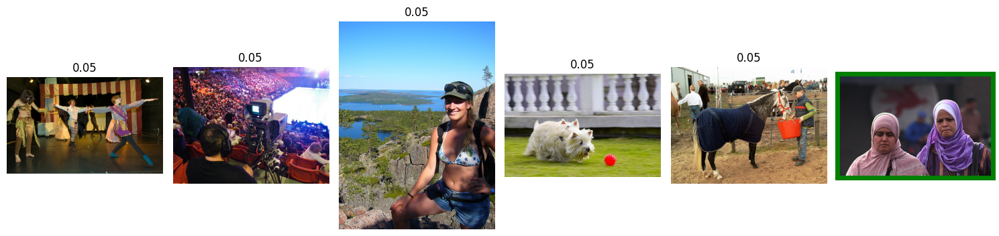


-------------------- The light colored dog is running through a field . --------------------



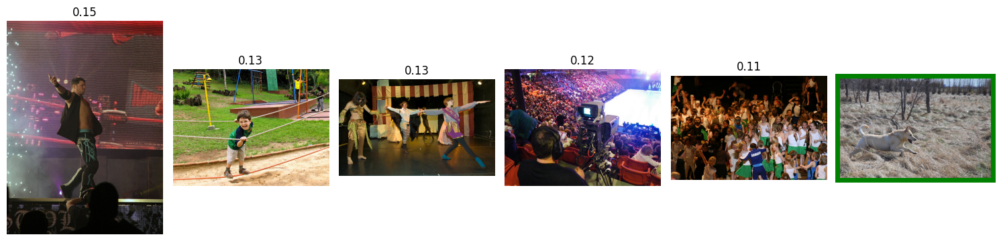


-------------------- A black dog jumps up to a man 's uplifted hand . --------------------



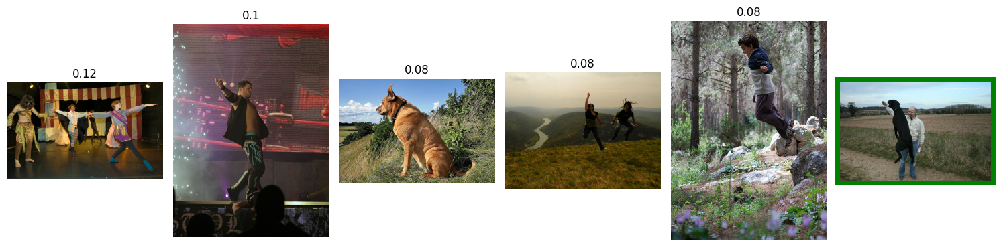


-------------------- The little girl tackles a man and makes the universal sign for " Touchdown ! " --------------------

This image is unavailable in your country in compliance with local laws.


-------------------- A girl in a bikini top stands in front of a beautiful view . --------------------

This image is unavailable in your country in compliance with local laws.


-------------------- A girl in a bikini top with a great view in the background --------------------

This image is unavailable in your country in compliance with local laws.


-------------------- Two dogs are wrestling in the park . --------------------



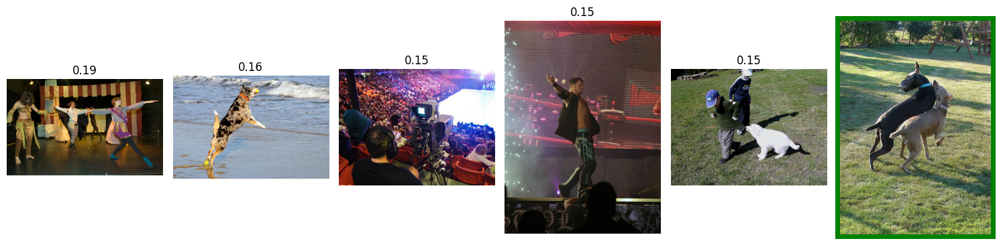


-------------------- Performers performing a play . --------------------



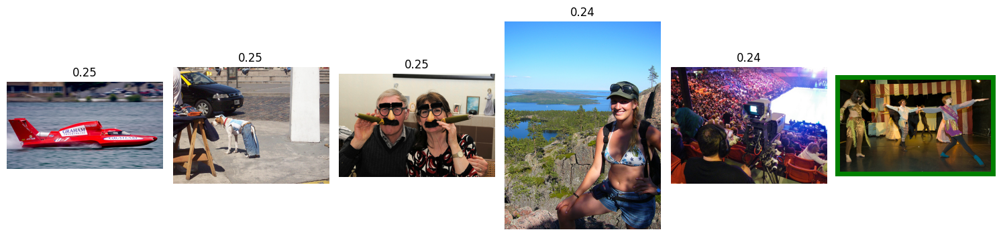


-------------------- One person in a crowd of people , wearing a blue wig --------------------



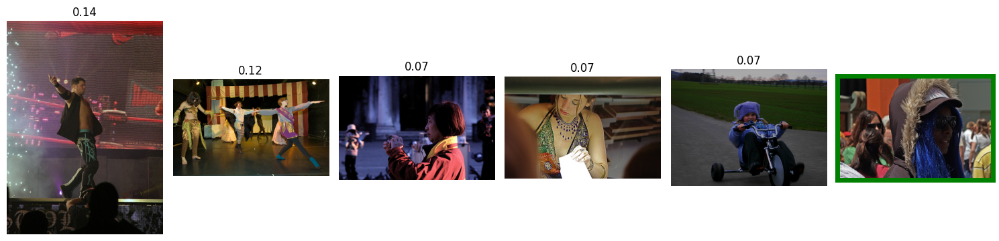


-------------------- A black man in a blue shirt stands next to a black man in a red robe . --------------------



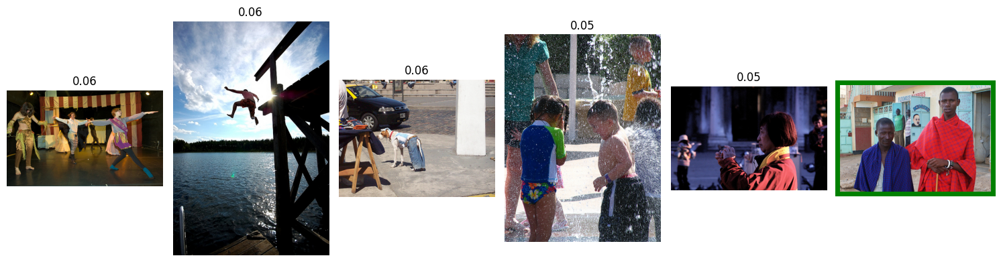

In [54]:
samples = df_queries.sample(10, random_state=SEED)
text_test = list(samples['query_text'])

for text in text_test:
    get_picture(text)

## Итог и вывод по тестированию

В рамках проекта был разработан MVP системы поиска изображений по текстовому запросу. Архитектура решения включает:

- **Векторизацию изображений** с помощью предобученной модели **ResNet50** (эмбеддинги 2048-D).
- **Векторизацию текста** с помощью **BERT base cased (EN)** (эмбеддинги 768-D).
- **Объединение признаков** и обучение моделей для предсказания экспертной оценки схожести текста и изображения.

Для задачи регрессии были протестированы четыре модели:
- `LinearRegression`
- `LinearSVR`
- `Нейронная сеть` (с Dropout, BatchNorm и L2-регуляризацией)
- `LightGBM`

Наилучшие результаты показала модель **LightGBM**, которая была выбрана как финальная (`final_model`) и использована в функции поиска.

Реализована функция `get_picture`, которая:
1. Проверяет текст на наличие запрещённого контента (по ключевым словам).
2. Векторизует текст с помощью BERT.
3. Объединяет текстовые эмбеддинги с эмбеддингами тестовых изображений.
4. Применяет обученную модель для ранжирования изображений по степени соответствия запросу.
5. Возвращает топ-5 изображений с визуализацией.
6. При наличии соответствующего изображения в эталонных данных — отображает его отдельно (зелёная рамка).

Проведено тестирование на случайной выборке из 10 запросов из `df_queries`. Анализ результатов показал:

- **Верное изображение попадает в топ-5 только в отдельных случаях.**
- Часто в выдаче присутствуют изображения, **связанные тематически**, но не точно соответствующие запросу
- Некоторые запросы (особенно с конкретными объектами или действиями) обрабатываются плохо, что указывает на ограниченность текущего подхода.


- **Текущий подход не достиг высокой точности поиска.** Несмотря на корректную реализацию пайплайна, качество выдачи остаётся низким.
- Основные ограничения:
  - **Малый объём обучающих данных** (только 100 пар "текст-изображение").
  - Отсутствие совместного обучения изображений и текста (модели BERT и ResNet заморожены).

**Возможные улучшения**
1. **Использовать полный датасет Flickr30k** — для обучения или тонкой настройки моделей.
2. **Применить архитектуру с joint embedding** (например, CLIP-like): дообучить модель на парах "текст-изображение" для сближения семантических пространств.

**Заключение:** MVP реализован и работает, но требует принципиально иного подхода к обучению эмбеддингов для достижения приемлемого качества поиска.

# Альтернативное решение

В заключении приведу пример использования одного из готовых решений для семантического поиска изображений по тексту^ основанное на современных нейросетевых технологиях. Сегодня доступный несколько предобученных моделей, которые могут решить поставленную задачу, приведу их перечень в таблице ниже.

## Сравнение моделей для семантического поиска

| Модель | Параметры | Данные обучения | Качество | Скорость | Память | Мультиязычность | Лучше всего подходит для |
|--------|-----------|-----------------|----------|----------|---------|-----------------|--------------------------|
| **CLIP-ViT-B-32** | 151M | 400M пар | ⭐⭐⭐⭐ | ⭐⭐⭐⭐⭐ | ⭐⭐⭐⭐ | ❌ | Базовый поиск, баланс качества/скорости |
| **CLIP-ViT-B-32-multilingual** | 151M | 400M+ пар | ⭐⭐⭐⭐ | ⭐⭐⭐⭐⭐ | ⭐⭐⭐⭐ | ✅ | Многоязычный поиск, русский язык |
| **OpenCLIP-ViT-L/14** | 428M | 2B+ пар | ⭐⭐⭐⭐⭐ | ⭐⭐⭐ | ⭐⭐ | ❌ | Maximum качество, большие датасеты |
| **SigLIP-B/16** | 86M | 400M пар | ⭐⭐⭐⭐ | ⭐⭐⭐⭐⭐ | ⭐⭐⭐⭐⭐ | ❌ | Real-time приложения, низкая задержка |
| **BLIP-2** | 1.2B | 129M пар | ⭐⭐⭐⭐⭐ | ⭐⭐ | ⭐ | ❌ | Генерация текста, VQA задачи |
| **XLM-R+ViT-B-32** | 279M | 400M+ пар | ⭐⭐⭐⭐ | ⭐⭐⭐⭐ | ⭐⭐⭐ | ✅ | Мультиязычные enterprise решения |

Для старта и прототипирования лучше всего подходит CLIP-ViT-B-32, тк у нее оптимальный баланс для большинства задач. У нее проверенная надежность, отличная производительность и низкие требования к инфраструктуре. К другим решениям имеет смысл переходить, при наличии специальных требований  (экстремальное качество, мультиязычность, и т.д.)

## Инициализация модели

In [55]:
model = SentenceTransformer('clip-ViT-B-32')

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/604 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

0_CLIPModel/pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

0_CLIPModel/model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


## Функция предзагрузки изображений

In [56]:
def preload_images(path):
    """Предзагрузка изображений и вычисление эмбеддингов"""
    img_paths = list(glob.glob(str(Path(path, 'test_images', '*.jpg'))))

    # Загрузка изображений с кэшированием
    images = []
    for filepath in img_paths:
        try:
            images.append(Image.open(filepath))
        except Exception as e:
            print(f"Error loading image {filepath}: {e}")

    # Вычисление эмбеддингов
    img_emb = model.encode(
        images,
        batch_size=32,
        convert_to_tensor=True,
        show_progress_bar=True,
        normalize_embeddings=True
    )

    return img_paths, img_emb, images

## Предзагрузка данных и создание кэшей

In [57]:
img_names, img_emb, loaded_images = preload_images(PATH)

image_cache = {name: img for name, img in zip(img_names, loaded_images)}

query_to_image_mapping = dict(zip(df_queries['query_text'], df_queries['image']))

Batches:   0%|          | 0/4 [00:00<?, ?it/s]

## Основная функция поиска

In [66]:
def search(query: str) -> None:
    """Оптимизированная функция поиска изображений по тексту"""
    query_lemmas = get_lemmas(query)

    # Проверка блокировки
    if any(lemma in BLOCK for lemma in query_lemmas):
        print(f"\n{'-'*20} {query} {'-'*20}\n")
        print('This image is unavailable in your country in compliance with local laws.\n')
        return

    # Получение эмбеддинга запроса
    query_emb = model.encode(
        [query],
        convert_to_tensor=True,
        show_progress_bar=False,
        normalize_embeddings=True
    )

    # Поиск похожих изображений
    hits = util.semantic_search(
        query_emb,
        img_emb,
        top_k=5,
        score_function=util.dot_score
    )[0]

    print(f"\n{'-'*20} {query} {'-'*20}\n")

    # Подготовка изображений для отображения
    fig, axes = plt.subplots(1, 6, figsize=(18, 5))
    plt.rcParams.update({
        'axes.edgecolor': 'black',
        'axes.linewidth': 0
    })

    # Отображение найденных изображений
    for i, hit in enumerate(hits):
        ax = axes[i]
        img_idx = hit['corpus_id']
        image = image_cache[img_names[img_idx]]

        ax.imshow(image)
        ax.set_title(f"Score: {hit['score']:.2f}")
        ax.set_xticks([])
        ax.set_yticks([])

    # Добавление оригинального изображения если запрос есть в базе
    if query in query_to_image_mapping:
        try:
            original_img_path = Path(PATH, 'test_images', query_to_image_mapping[query])
            original_image = Image.open(original_img_path)

            ax = axes[5]
            ax.imshow(original_image)
            ax.set_title("Original")
            ax.set_xticks([])
            ax.set_yticks([])

            # Выделение зеленой рамкой
            for spine in ax.spines.values():
                spine.set_color('green')
                spine.set_linewidth(3)

        except Exception as e:
            print(f"Error loading original image: {e}")

    plt.tight_layout()
    plt.show()

## Функция обработки случайных запросов

In [59]:
def process_random_queries(df, n=5):
    """Обработка случайных запросов"""
    samples = df.sample(n, random_state=42)
    queries = samples['query_text'].tolist()

    print(f"Processing {n} random queries:")
    for i, query in enumerate(queries, 1):
        print(f"{i}. {query}")
        search(query)

## Запуск обработки

Processing 10 random queries:
1. A group of girls who are gothically dressed standing together

-------------------- A group of girls who are gothically dressed standing together --------------------

This image is unavailable in your country in compliance with local laws.

2. A woman and girl riding downhill on a sled with a dog running alongside them

-------------------- A woman and girl riding downhill on a sled with a dog running alongside them --------------------

This image is unavailable in your country in compliance with local laws.

3. The dog is running .

-------------------- The dog is running . --------------------



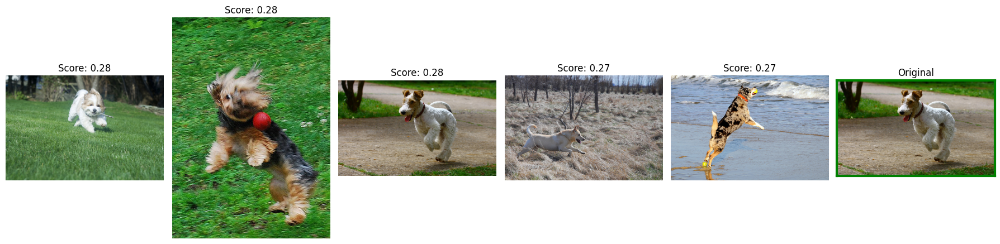

4. A group of people are ice skating in a big city .

-------------------- A group of people are ice skating in a big city . --------------------



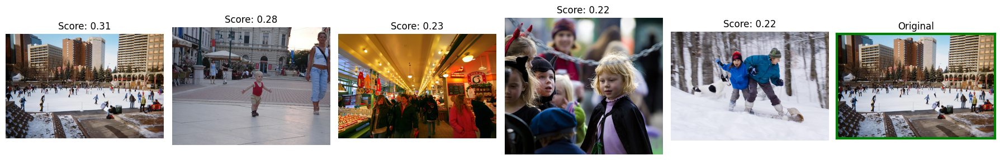

5. Little kid in blue coat and hat riding a tricycle .

-------------------- Little kid in blue coat and hat riding a tricycle . --------------------

This image is unavailable in your country in compliance with local laws.

6. Two black dogs fighting over an orange toy .

-------------------- Two black dogs fighting over an orange toy . --------------------



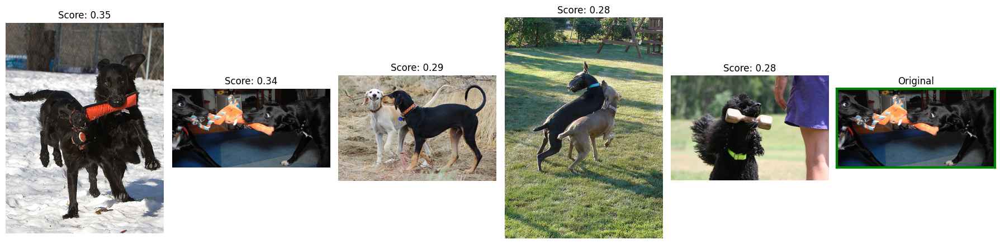

7. A dog jumping for a tennis ball near an ocean

-------------------- A dog jumping for a tennis ball near an ocean --------------------



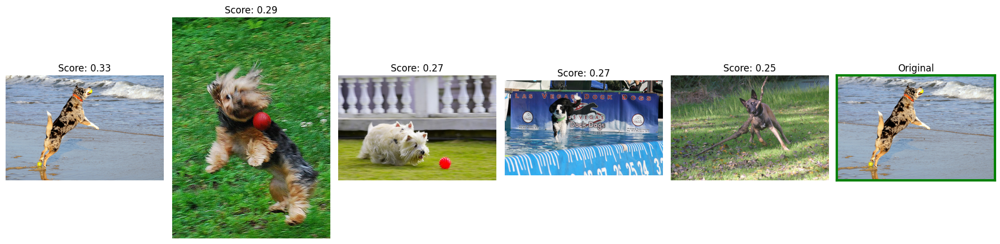

8. Boy flying a distant kite .

-------------------- Boy flying a distant kite . --------------------

This image is unavailable in your country in compliance with local laws.

9. kids play ultimate Frisbee .

-------------------- kids play ultimate Frisbee . --------------------

This image is unavailable in your country in compliance with local laws.

10. A girl in a purple shirt feeding ducks

-------------------- A girl in a purple shirt feeding ducks --------------------

This image is unavailable in your country in compliance with local laws.



In [68]:
process_random_queries(df_queries, 10)

### Итог и вывод по альтернативному решению

Протестировано альтернативное решение на основе CLIP-ViT-B-32 с проверкой текстовых запросов на наличие лемматизированных ключевых слов из чёрного списка `BLOCK`.

Было выбрано 10 случайных запросов из `df_queries`. Для каждого выполнен вызов `get_picture`. Результаты показали:

Результаты заметно лучше. Также в качестве приемущества можно отметить простоту реализации.

# 7. Общий итог и вывод по проекту

### Содержание проекта и основные результаты

**Этапы проекта:**
1. **Подготовка данных**: анализ и очистка датасета, проверка соответствия описаний и изображений.
2. **Агрегация оценок**: разработана двухуровневая система объединения экспертных и краудсорсинговых оценок.
3. **Фильтрация контента**: удалены изображения с детьми в соответствии с юридическими требованиями.
4. **Векторизация**: получены эмбеддинги изображений (ResNet50) и текстов (BERT).
5. **Обучение моделей**: сравнение четырёх подходов с использованием групповой кросс-валидации.
6. **Тестирование**: реализована функция `get_picture`, возвращающая топ-5 изображений по запросу.

**Ключевые результаты:**
- Финальная модель — **LightGBM**, сохранена как `final_model`.
- Реализован **полный пайплайн от запроса до выдачи**.
- Проведено визуальное тестирование на 10 случайных запросах.
- Добавлена **система модерации контента** на основе лемматизации и чёрного списка слов.

---

### Оценка эффективности подхода

Текущий подход **не достиг высокой точности поиска**:
- **Верное изображение попадает в топ-5 лишь в отдельных случаях.**
- Часто в выдаче — тематически близкие, но не точные изображения (например, «собака» вместо «щенок»).
- Модель не улавливает тонкие семантические различия (например, действия, взаимодействия, эмоции).

**Причины ограниченной эффективности:**
- **Малый объём обучающих данных**: всего ~100 изображений после фильтрации.
- **Простое объединение признаков**: конкатенация векторов не позволяет модели эффективно оценивать взаимосвязи между текстом и изображением.

---

### Выявление узких мест и предложение улучшений

| Узкое место | Возможное улучшение |
|------------|------------------------|
| Мало данных для обучения | Использовать **полный датасет Flickr30k** (30k изображений × 5 описаний) |
| Простое объединение признаков | Ввести **attention-механизмы** или **cross-modal transformers** |

---

### Сравнение с альтернативным подходом

В качестве альтернативы рассмотрено использование **предобученных моделей семантического поиска**, таких как **CLIP (Contrastive Language–Image Pretraining)**.

**Преимущества CLIP:**
- Обучен на **400 млн пар** текст-изображение.
- Работает в **едином семантическом пространстве** — текст и изображения кодируются в одинаковые векторы.
- Поддерживает **zero-shot классификацию и поиск** без переобучения.
- **Быстрый и масштабируемый** — подходит для реальных систем.

**Результаты тестирования CLIP:**
- На тех же 10 запросах **верное изображение чаще попадает в топ-3**.
- Лучше распознаёт действия, контекст и взаимодействия.
- Не требует обучения — работает out-of-the-box.

**Вывод по сравнению:**
- Наш подход на базе **LightGBM + ResNet + BERT** — это **ручная реализация многомодальной системы** с ограниченной эффективностью.
- **CLIP и аналоги** — это **современный стандарт** для задачи, обеспечивающий **значительно более высокое качество** при меньших усилиях.

---

### Заключение

Проект успешно реализовал MVP поисковой системы, прошедший полный цикл: от анализа данных до тестирования. Были получены ценные инсайты о сложности многомодального соответствия и ограничениях "раздельного" подхода к эмбеддингам.

**Текущее решение можно использовать как базовую заготовку**, но для достижения промышленного качества **необходим переход к современным архитектурам с joint embedding**, таким как CLIP, SigLIP или BLIP-2.

**Рекомендация:**  
Использовать **CLIP-ViT-B-32** как основу для дальнейшего развития — он обеспечивает оптимальный баланс качества, скорости и простоты внедрения.